## Lab 2 - Exploring Image Data
### By. Liam Lowsley-Williams, Eli Laird, Fernando Vazquez

## Business Understanding

For this lab we chose to use a dataset that consists of satellite images of ships traveling the seas. These images are aerial views of two categories, one being images which contain ships and the other being images that do not contain ships. The dataset contains 1000 images that are classified as having ships in them and 3000 images that do not. The images were extracted from planet satellite imagery collected over the San Francisco Bay and San Pedro Bay areas of California. We hope to be able to classify whether images in the test dataset have or do not have ships in them.

The dataset was taken from www.kaggle.com and the reason behind its curation, according to the creator, is to “help address the difficult task of detecting the location of large ships in satellite images.” He continues, “Automating this process can be applied to many issues including monitoring port activity levels and supply chain analysis.” This is primarily the reason we are interested in using this dataset. Being able to identify ships via satellite images could be immensely useful in automating a wide variety of issues. For example, it could be used to maintain maritime sovereignty for governments around the world, allowing countries to identify whether a ship has entered a nation’s water along with other useful information like size and type. It could also be used to identify illegal activities such as poaching, drug trafficking, and stolen vessels. Being able to identify this information would help keep the waters safe for all humans and maritime animals alike. Lastly, it could also be very useful for analytic data as well. Being able to obtain statistics regarding motorized vessels that are traveling or sitting in bodies of water around the world could potentially provide interesting insight when further analyzed.

In our use case, our prediction task would be to identify whether or not there is a ship in a given satellite image. The third parties that could be potentially interested in this algorithm are shipping companies, harbor managers, research groups, federal, state and local law enforcement agencies, and maritime tracking companies. It would also be very useful to governments because they are typically the overseers of the world and have access to the satellites and the technology to collect more data. However, in order for this algorithm to be useful to third parties, we would need to get more data from around the globe. This lab is more tailored as a feasibility study due to the limited dataset it utilizes and lack of variance in worldwide data.

Dataset - https://www.kaggle.com/rhammell/ships-in-satellite-imagery 

## Data Preparation

In [1]:
import pandas as pd
import numpy as np
%matplotlib inline 
from matplotlib import pyplot as plt
import cv2
import os

In [2]:
file_path= './shipsnet/shipsnet/'

images_dir = os.listdir(file_path)

# read in images
images = []
labels_ext = []

error_count = 0
for img in images_dir:
    image = cv2.imread(file_path + img, cv2.IMREAD_GRAYSCALE)
    try:
        images.append(image.flatten())
        label = 'ship' if img[0] == '1' else 'no ship'
        labels_ext.append((label,img))
    except:
        error_count += 1

# create our variables for images and labels
images = np.array(images)
labels_ext = np.array(labels_ext)
labels = [i[0] for i in labels_ext]

# specify height and width
h, w = (80,80)

print("{} Images failed to resize".format(error_count))
print("Image size:", images[0].shape)
print("Image Count:", len(images))

0 Images failed to resize
Image size: (6400,)
Image Count: 4000


In [3]:
# select random images to visualize
import random
random.seed(1)

# function to plot images in grid like fashion
def plot_gallery(images, title, h, w, n_row=3, n_col=6):
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    rand_sample = random.sample(range(0,images.shape[0]), k=18)
    for n,i in enumerate(rand_sample):
        plt.subplot(n_row, n_col, n + 1)
        plt.imshow(images[i].reshape((h,w)))
        plt.title(title[i], size=12)
        plt.xticks(())
        plt.yticks(())

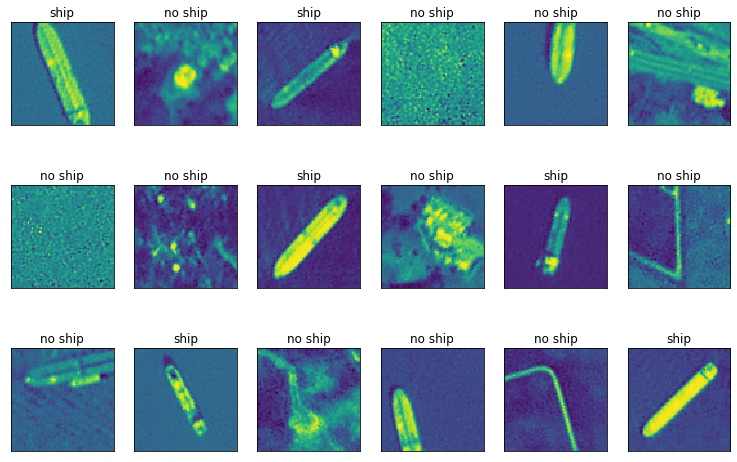

In [4]:
# plot images
plot_gallery(images, labels, h, w)

## Data Reduction

In [5]:
# re-assign variable names to make sense
X = images
y = labels

### Linear Dimensionality Reduction - PCA

In [6]:
from sklearn.decomposition import PCA
import pickle

n_components = 300

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenships_pca = pca.components_.reshape((n_components, h, w))

# pickle dump
pickle.dump(eigenships_pca, open('eigenships_pca.p', 'wb'))

CPU times: user 12.9 s, sys: 368 ms, total: 13.2 s
Wall time: 2.23 s


In [7]:
# pickle load pca
eigenships_pca = pickle.load(open('eigenships_pca.p','rb'))

In [64]:
# function to plot variance
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode()
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'), title="Explained Variance PCA")
    })
        

In [65]:
# plot variance
plot_explained_variance(pca)

Analysis of the graph of explained variance for each component tells us that to represent an image with 80% accuracy it takes 26 components. In order to get 90% accuracy we would need to use 98 components. Since getting to 90% accuracy takes 98% components and for 80% accuracy takes 26 components We can conclude that at 80% accuracy we can adequately represent our images.

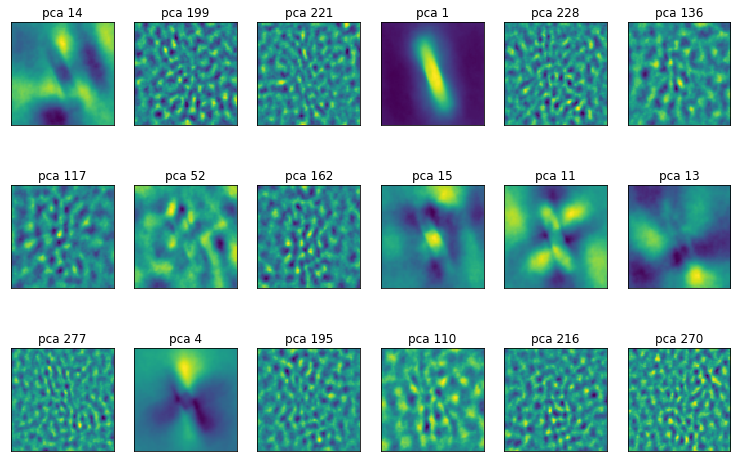

In [10]:
# PCA image reconstruction
eigenships_pca_titles = ["pca %d" % i for i in range(eigenships_pca.shape[0])]
plot_gallery(eigenships_pca, eigenships_pca_titles, h, w)

In [11]:
# function to reconstruct image
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
# index to reconstruct
idx_to_reconstruct = 1    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

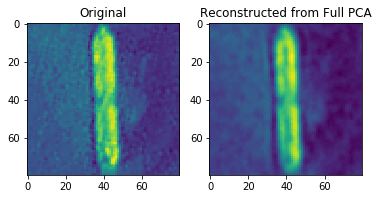

In [12]:
# plot original image against image reconstructed with full PCA
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)))
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)))
plt.title('Reconstructed from Full PCA')
plt.grid(False)

As we can see, we have a pretty good reconstruction when using full PCA and comparing the images side by side.

## Non-Linear Dimensionality Reduction - KPCA

In [13]:
from sklearn.decomposition import KernelPCA
n_components = 300

# kernel pca with linear kernel
kpca_linear = KernelPCA(
    n_components=n_components, 
    kernel='linear', 
    fit_inverse_transform=True,
    remove_zero_eig=True,
    n_jobs=-1)  
%time kpca_linear.fit(X.copy())

CPU times: user 54.8 s, sys: 4.84 s, total: 59.7 s
Wall time: 9 s


KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
          fit_inverse_transform=True, gamma=None, kernel='linear',
          kernel_params=None, max_iter=None, n_components=300, n_jobs=-1,
          random_state=None, remove_zero_eig=True, tol=0)

In [14]:
#pickle dump kpca linear
pickle.dump(kpca_linear, open( 'eigenships_kpca_linear.p', 'wb' ))

In [15]:
# pickle load kpca linear
kpca_linear = pickle.load(open('eigenships_kpca_linear.p','rb'))

In [16]:
# kernel pca with polynomial kernel
kpca_poly = KernelPCA(
    n_components=n_components, 
    kernel='poly', 
    fit_inverse_transform=True,
    remove_zero_eig=True,
    n_jobs=-1)  
%time kpca_poly.fit(X.copy())

CPU times: user 53.3 s, sys: 5.02 s, total: 58.3 s
Wall time: 8.68 s


/Users/eli/anaconda3/envs/mlenv/lib/python3.7/site-packages/sklearn/decomposition/kernel_pca.py:257: LinAlgWarning:

Ill-conditioned matrix (rcond=7.19491e-17): result may not be accurate.



KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
          fit_inverse_transform=True, gamma=None, kernel='poly',
          kernel_params=None, max_iter=None, n_components=300, n_jobs=-1,
          random_state=None, remove_zero_eig=True, tol=0)

In [17]:
# pickle dump kpca poly
pickle.dump(kpca_poly, open( 'eigenships_kpca_poly.p', 'wb' ))

In [18]:
# pickle load kcpa poly
kpca_poly = pickle.load(open('eigenships_kpca_poly.p','rb'))

In [19]:
import warnings
from ipywidgets import widgets

# function for widget slider for images
def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca_linear = kpca_linear.inverse_transform(kpca_linear.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca_poly = kpca_poly.inverse_transform(kpca_poly.transform(X[idx_to_reconstruct].reshape(1, -1)))
    
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,4,1)
    plt.imshow(X[idx_to_reconstruct].reshape((h, w)))
    plt.title('Original')
    plt.grid()
    
    plt.subplot(1,4,2)
    plt.imshow(reconstructed_image.reshape((h, w)))
    plt.title('Full PCA')
    plt.grid()

    plt.subplot(1,4,3)
    plt.imshow(reconstructed_image_kpca_linear.reshape((h, w)))
    plt.title('Kernel PCA - Linear')
    plt.grid()
    
    plt.subplot(1,4,4)
    plt.imshow(reconstructed_image_kpca_poly.reshape((h, w)))
    plt.title('Kernel PCA - Poly')
    plt.grid()
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,X.shape[0]-1,1),__manual=True)

interactive(children=(IntSlider(value=1999, description='idx_to_reconstruct', max=3999), Output()), _dom_class…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

We see here that the Kernel PCA - Polynomial worked the best at reconstruction by far.

In [66]:
# plot variance
plot_explained_variance(pca)

In [57]:
# plot_explained_variance(kpca_poly)
import plotly
from plotly.graph_objs import Bar, Line
from plotly.graph_objs import Scatter, Layout
from plotly.graph_objs.scatter import Marker
from plotly.graph_objs.layout import XAxis, YAxis
n_components = 300
kpca_poly = KernelPCA(
    n_components=n_components, 
    kernel='poly', 
    fit_inverse_transform=True,
    remove_zero_eig=True,
    n_jobs=-1)  
%time x=kpca_poly.fit_transform(X.copy())

/Users/eli/anaconda3/envs/mlenv/lib/python3.7/site-packages/sklearn/decomposition/kernel_pca.py:257: LinAlgWarning:

Ill-conditioned matrix (rcond=7.19491e-17): result may not be accurate.



CPU times: user 1min 4s, sys: 5.29 s, total: 1min 10s
Wall time: 10.2 s


/Users/eli/anaconda3/envs/mlenv/lib/python3.7/site-packages/sklearn/decomposition/kernel_pca.py:257: LinAlgWarning:

Ill-conditioned matrix (rcond=7.19491e-17): result may not be accurate.



In [67]:
explained_variance = np.var(x, axis=0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)
cumvar_exp=np.cumsum(explained_variance_ratio)
plotly.offline.init_notebook_mode()
    
# explained_var = pca.explained_variance_ratio_
# cum_var_exp = np.cumsum(explained_var)
    
plotly.offline.iplot({
    "data": [Bar(y=explained_variance_ratio, name='individual explained variance'),
    Scatter(y=cumvar_exp, name='cumulative explained variance')
    ],
    "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'), title="Explained Variance KPCA - Polynomial")
})

We represented both the non-linear and linear dimension graphs to show the explained variances for each, we saw that to get to 90% accuracy for the linear graph it required 98 components while to get the same accuracy for the non-linear graph it required 23 components. To get 80% accuracy for linear it took 28 components and for non-linear it took 2 components. We can conclude from our graphs that the non-linear method produced better results with less components and if we compare them visually we can also see that when compared to the original image the poly KPCA produced much better visual results than just the normal PCA. The PCA produced a less crisp image than the KPCA.

## Feature Extraction - DAISY

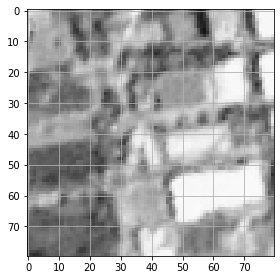

In [20]:
from skimage.io import imshow
# choose random image to perform DAISY on
idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.grid()

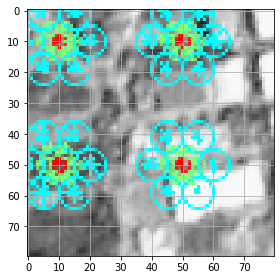

In [21]:
from skimage.feature import daisy
# visualize what daisy would look like on image
features, img_desc = daisy(img, 
                           step=40, 
                           radius=10, 
                           rings=2, 
                           histograms=6, 
                           orientations=8, 
                           visualize=True)
imshow(img_desc)
plt.grid()

In [22]:
# function that will take an image and perform daisy feature extraction
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=10, radius=10, rings=2, histograms=6, orientations=8, visualize=False)
    return feat.reshape((-1))

In [23]:
# apply function above to all images, row by row
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: user 28.5 s, sys: 352 ms, total: 28.8 s
Wall time: 28.1 s
(4000, 3744)


In [24]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: user 2.46 s, sys: 47.5 ms, total: 2.51 s
Wall time: 483 ms


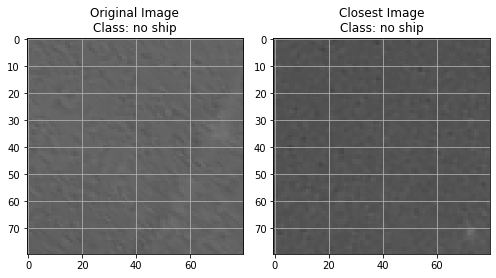

In [25]:
import copy
# specify index to look at
idx1 = 200

# given index find an image with the closest pairwise 
#   differnce and display it
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty
idx2 = np.argmin(distances)

# plot
plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image\nClass: {}".format(y[idx1]))
plt.grid()
plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image\nClass: {}".format(y[idx2]))
plt.grid()

In [26]:
from ipywidgets import fixed

# function that will find the closest and next closest image
#   to a given image with a specified index from widget slider
def closest_image(dmat,idx1):
    distances = copy.deepcopy(dmat[idx1,:])
    distances[idx1] = np.infty
    idx2 = np.argmin(distances)
    
    distances[idx2] = np.infty
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Origina Image\nClass: {}".format(y[idx1]))
    plt.grid()
    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("Closest Image\nClass: {}".format(y[idx2]))
    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("Next Closest Image\nClass: {}".format(y[idx3]))
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,X.shape[0]-1,1),dmat=fixed(dist_matrix),__manual=True)


interactive(children=(IntSlider(value=1999, description='idx1', max=3999), Output()), _dom_classes=('widget-in…

<function __main__.closest_image(dmat, idx1)>

Using DAISY as our feature extraction method here shows promise for our prediction task because once we build the classifier, the classification performance worked actually quite well. For the majority of the images, when the classifier attempted to find the next most similar image that was not itself, it was able to find an image that fit the same class. In fact, the classifier almost always was able to find another ship image given a ship image and was very good at finding similar looking ships. This would help us tremendously in our business understanding as we could distinguish smaller sized ships from larger sized ones. DAISY also worked really well when finding the 2nd most similar image and often was able to classify the image as a ship that looked a bit less similar than the most similar image but still very good.


## Exceptional Work

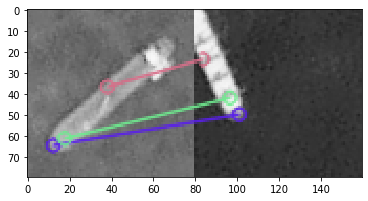

(<matplotlib.image.AxesImage at 0x1a343d1490>, None)

In [68]:

#use SIFT to match keypoints between two images


img1 = X[3001].reshape((80,80))
img2 = X[3004].reshape((80,80))

sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

bf = cv2.BFMatcher()
 
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])
    

img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None, flags=2)

plt.imshow(img3),plt.show()



In [29]:
#function to apply the sift feature extractor and return keypoints 
def apply_sift(row, shape):
    sift = cv2.xfeatures2d.SIFT_create()
    # find the keypoints and descriptors with SIFT
    kp, des = sift.detectAndCompute(row.reshape(shape), None)
    return (kp,des.reshape((-1)))

In [30]:
#function match keypoints between two pictures
def match_sift_features(des1, des2):
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])
        
    return good

In [48]:
#function to find the top 2 nearest neighbors 
def nearest_neighbors_sift(image, matrix):
    
    neighbors = []
    kp1, descriptor1 = apply_sift(image, (80,80))
    
    for row in matrix:
        try:
            kp2, descriptor2 = apply_sift(row, (80,80))
            matching_feats = match_sift_features(descriptor1,descriptor2)
            neighbors.append((len(matching_feats), matching_feats,kp2, row))
        except: continue
                    
    #sorts neighbors by the number of shared key points b/w original and neighbor
    neighbors.sort(reverse= True)

    return (neighbors[0], neighbors[1])
                    

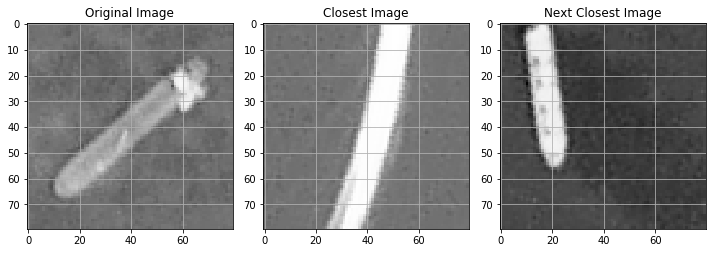

In [55]:

idx1 = 3001
img1 = X[idx1]

neighbor1, neighbor2 = nearest_neighbors_sift(img1, X[3004:3010,])

#printing nearest neighbors
kp0, des0 = apply_sift(X[idx1], (80,80))
kp1, des1 = apply_sift(neighbor1[3], (80,80))
kp2, des2 = apply_sift(neighbor2[3], (80,80))

bf = cv2.BFMatcher()
 
matches1 = match_sift_features(des0, des1)
matches2 = match_sift_features(des0, des2)


plt.figure(figsize=(10,16))
plt.subplot(1,3,1)
imshow(X[3001].reshape((80,80)))
plt.title("Original Image")
plt.grid()
plt.subplot(1,3,2)
imshow(neighbor1[3].reshape((80,80)))
plt.title("Closest Image")
plt.grid()

plt.subplot(1,3,3)
imshow(neighbor2[3].reshape((80,80)))
plt.title("Next Closest Image")
plt.grid()

There are many image corner detectors, like Harris corner detection, that are unaffected by rotations. What this means is that the Harris algorithm will find corners in an image even after the same image has been rotated at any angle. While these corner detection techniques are invariant to rotations, they are not, however, invariant to any scaling to the image. For example, if an image feature extractor finds corners in an image, the same feature extractor would fail to find the same corners when the image is scaled to 2x size. To counter this phenomenon, the Scale-Invariant Feature Transform (SIFT) was created in 2004 by David Lowe from the University of British Columbia. 

How it works:

To detect corners in a scaled image, you cannot use the same filter size for different scales. SIFT uses scale-filtering to adjust the filter size to the corresponding size of the scaled image. The scale-filtering technique finds the Laplace of a Gaussian with varying standard deviations to detect blobs in an image. The Laplace of a Gaussian will return higher values for small corners and lower values for larger corners. To save on computation time, SIFT uses the Difference of Gaussians to approximate the Laplace of the Gaussian. SIFT will then compare key points of the filter to corresponding filter key points from images scaled to multiple values. Then a nearest neighbors alogorithm is used to find keypoints that are close to each other in all dimensions of the scaled values.
